# Milan Bansal
# Roll no: 214102318

# $$ \color{red} { \text{ASSIGNMENT : 2} }$$

In [1]:
import numpy as np
import math
import random
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

#### Q.1.
#### Bernoulli distribution is the discrete probability distribution of a random variable which takes the value 1 with probability p and the value 0 with probability q = 1 − p. A binomial random variable is random variable that represents the number of successes in n successive independent trials of a Bernoulli experiment. E.g. The number of heads in n coin flips. If X is a Binomial random variable, we denote this X ∼ B(n, p), where p is the probability of success in a given trial. The probability distribution of a random variable X which assumes integral values k = 0, . . . , n with the probabilities:
$$ P_{r}(X = k) = {n\choose x}p^{k} (1-p)^{n-k}  $$         if k ∈ N, 0 ≤ k ≤ n 
#### Assume that some messages being transmitted over a network, there is a probability that the bits will be corrupted. A Hamming code allows for a 4 bit code to be encoded as 7 bits, with the advantage that if 0 or 1 bit(s) are corrupted, then the message can be perfectly reconstructed. You are working on a system where the probability of any bit being lost is 0.1. How does reliability change when using a Hamming code?

#### Plot the probability of using error-correcting codes and the probability of without using error-correcting codes.

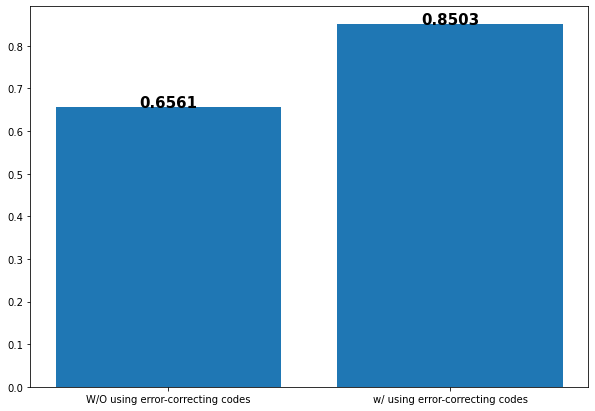

Reliability change = 29.6%


In [2]:
def binom(n,k,p):
    return math.comb(n,k) * (p**k) * ((1-p)**(n-k))

wo_ham = round(binom(4,0,0.1),4)
w_ham = round(binom(7,0,0.1) + binom(7,1,0.1) , 4)

rel_chng = (w_ham - wo_ham) / wo_ham * 100
fig1 = plt.figure(figsize = (10,7))
ax1 = fig1.add_subplot(111)
ax1.bar(['W/O using error-correcting codes', 'w/ using error-correcting codes'], [wo_ham, w_ham])
plt.text(0,wo_ham,wo_ham, ha = 'center', weight = 'bold', fontsize = 15)
plt.text(1,w_ham,w_ham, ha = 'center', weight = 'bold', fontsize = 15)
plt.show()

print(f'Reliability change = {round(rel_chng,1)}%')

# 2.)
#### Let $X_{1}, X_{2},..., X_{100},$ be independent and uniformly distributed random variables over [0, 1] and Y = $\sum_{1}^{100}  X_{i}$
#### Generate the probability density function (PDF) of Y .

##### $ \color{blue} { \text{PDF of sum of random variables is the convolution of their PDFs} }$

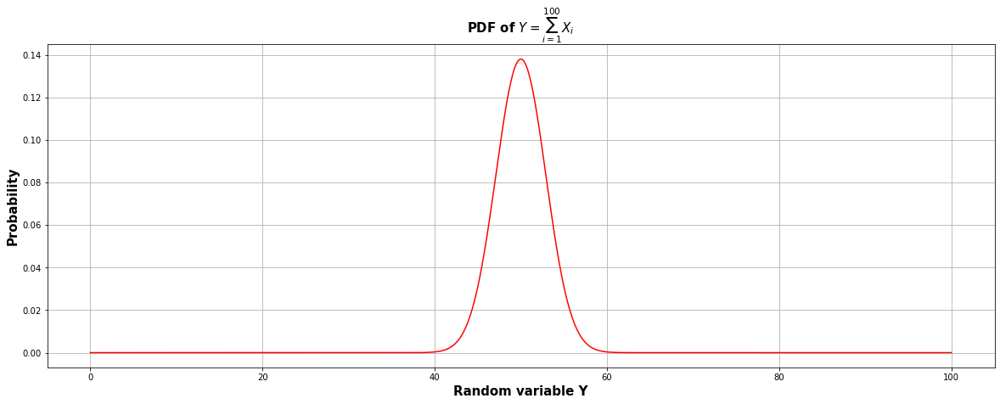

In [3]:

n = 1000 # considering n points between 0 and 1

# Since RV is uniformly distributed bw 0 and 1 therefore prob of all points in all Xi is 1

pdf_unif = np.ones(n) # pdf of each Xi 

res = np.convolve(pdf_unif,pdf_unif) * (1/n) # convolution of pdf of two uniform RVs

for i in range(98): # convoluting pdf of rest of the 98 RVs with the previous result to get pdf of 100 RVs convoluted
    res = np.convolve(res, pdf_unif) * (1/n)
    
# plotting the pdf of Y
fig2 = plt.figure(figsize = (20,7))
ax2 = fig2.add_subplot(111)
ax2.plot(np.linspace(0,100,len(res)),res, 'r')
ax2.set_xlabel('Random variable Y', weight = 'bold', size = 15)
ax2.set_ylabel('Probability', weight = 'bold', size = 15)
ax2.set_title(r'PDF of $Y=\sum_{i=1}^{100}X_i$', weight = 'bold', size = 15)
ax2.grid()
plt.show()
    

# 3.)
#### The autocorrelation sequence of a random process can be estimated from a finite number of samples, e.g. x(n) for n = 0, 1, . . . , N − 1. The autocorrelation may be estimated using the sample autocorrelation as:
$$ \hat r_{x}(k) = \frac{1}{N} \sum_{n=0}^{N-1} x(n) x^{\ast}(n-k)$$
#### Since x(n) is only given for values of n within the interval [0, N − 1], in evaluating this sum, x(n) is assumed to be equal to zero for values of n that are outside the interval [0, N − 1].
#### With x(n) = 1 for n = 0, 1, . . . , 7; plot the input sequence and the sample autocorrelation sequence ˆrx (each must be on a subplot).

In [4]:
def auto_corr(x,k):
    N = len(x)
    if k == 0:
        return np.sum(x*x) / N
    elif k > 0:
        return np.sum(x[k:] * x[:-k]) / N
    elif k < 0:
        return np.sum(x[-k:] * x[:k]) / N

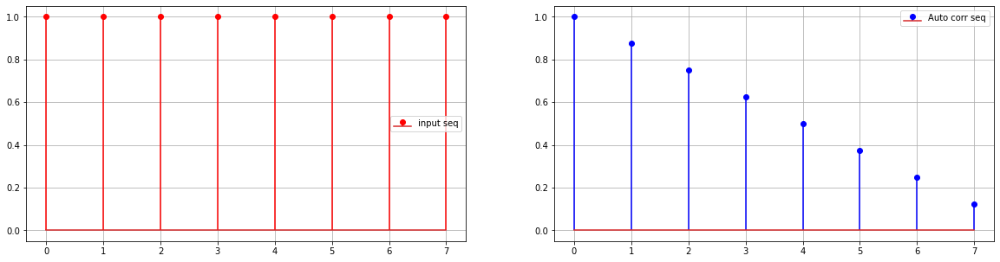

In [5]:
nn = np.arange(0,8)

xnn = np.ones(8) # given xn

Rxn = [] # empty list for storing auto correlation seq values

# performing autocorrelation
for k in range(8):
    Rxn.append(auto_corr(xnn,k))

# plotting
fig3 = plt.figure(figsize = (20,5)) 
ax31 = fig3.add_subplot(121)
ax31.stem(nn,xnn,'r',markerfmt='ro',label='input seq')
plt.legend()
plt.xticks(nn)
plt.grid(True)

ax32 = fig3.add_subplot(122)
ax32.stem(nn,Rxn,'blue',markerfmt='bo',label='Auto corr seq')
plt.legend()
plt.xticks(nn)
plt.grid(True)


plt.show()        

# 4 a.)
#### Generate N samples of zero mean with unit variance white Gaussian noise. Plot the histogram

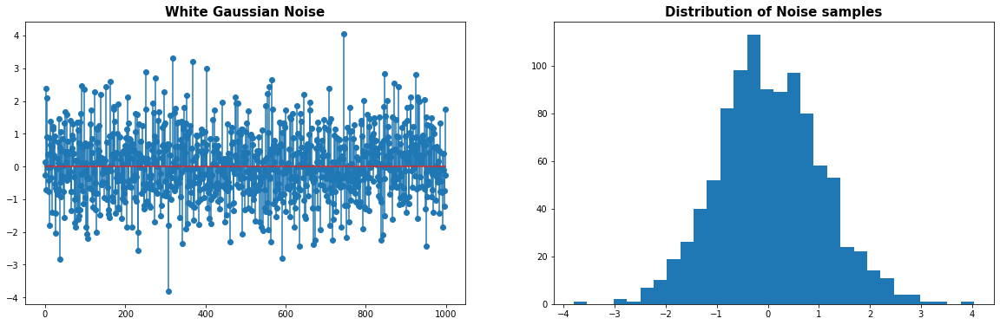

In [6]:
N = 1000
x = np.random.normal(0,1,N) # N samples from standard normal distribution


fig4a = plt.figure(figsize = (20,6))
ax41 = fig4a.add_subplot(121)
plt.stem(x)
plt.title('White Gaussian Noise' , size= 15,weight = 'bold')


ax42 = fig4a.add_subplot(122)
plt.hist(x , bins = 30)
plt.title('Distribution of Noise samples' , size= 15,weight = 'bold')
plt.show()


# 4 b.)
#### Estimate the first M lags of the autocorrelation sequence using the sample autocorrelation as
$$ \hat r_{x}(k) = \frac{1}{N} \sum_{n=0}^{N-1} x(n) x(n-k)$$

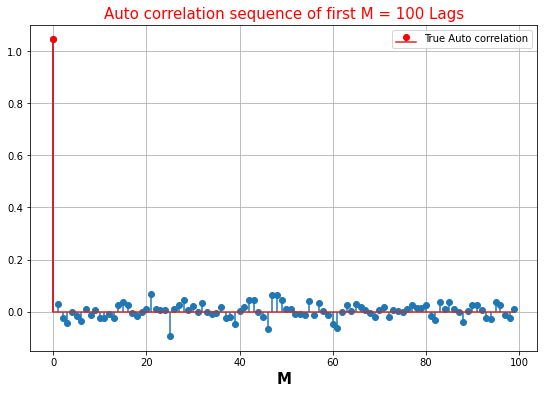

In [7]:
M = 100
rx_lags = []
true_rx = auto_corr(x,0)
for i in range(M):
    rx_lags.append(auto_corr(x,i))

fig4b = plt.figure(figsize = (20,6))
ax43 = fig4b.add_subplot(121)
plt.stem(rx_lags)
plt.stem([0],[true_rx],'r', markerfmt = 'ro', label = 'True Auto correlation')
plt.xlabel('M' , size = 15 , weight = 'bold')
plt.title(r'Auto correlation sequence of first M = 100 Lags',color='r', size= 15)
plt.legend()
plt.grid()
plt.show()

# 4 c.)
#### Segment your white noise sequence into ten different white noise sequences each having a length of M samples, and estimate the autocorrelation by averaging the sample autocorrelations of each subsequence, i.e.,
$$ \hat r_{x}(k) = \frac{1}{N} \sum_{m=0}^{9} \sum_{n=0}^{M-1} x(n+100m) x(n-k+100m), k=0,1,2...M-1$$
#### Compare your estimate to that in part (b)? Also, compare it to the true autocorrelation sequence rx(k)? Choose N = 1000 and M = 100.

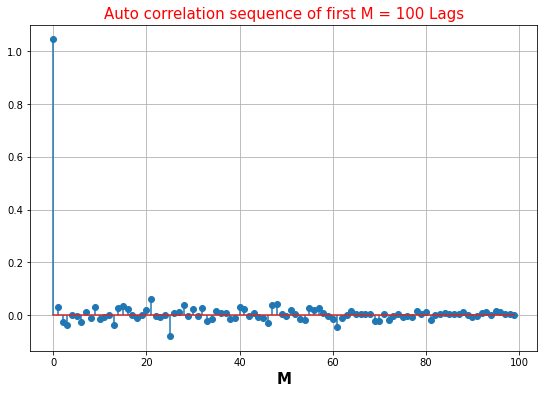

In [8]:
avg_auto_corr = []

for k in range(100):
    avg = 0
    for i in range(10):
        samp = auto_corr(x[(i*100):(100 + i*100)], k) / 10
        avg = avg + samp
    avg_auto_corr.append(avg)

fig4c = plt.figure(figsize = (20,6))
ax44 = fig4c.add_subplot(121)
plt.stem(avg_auto_corr)
# plt.stem([0],[true_rx],'r', markerfmt = 'ro', label = 'True Auto correlation')
plt.xlabel('M' , size = 15 , weight = 'bold')
plt.title(r'Auto correlation sequence of first M = 100 Lags',color='r', size= 15)
# plt.legend()
plt.grid()
plt.show()

# 4 d.)
#### Generate 10000 samples of a zero mean with unit variance white Gaussian noise sequence and estimate the first 100 lags of the autocorrelation sequence as in part (b). Plot the histogram of white Gaussian noise for 10000 samples. Compare your estimate to that in part (b)? What conclusions can you draw from these experiments?

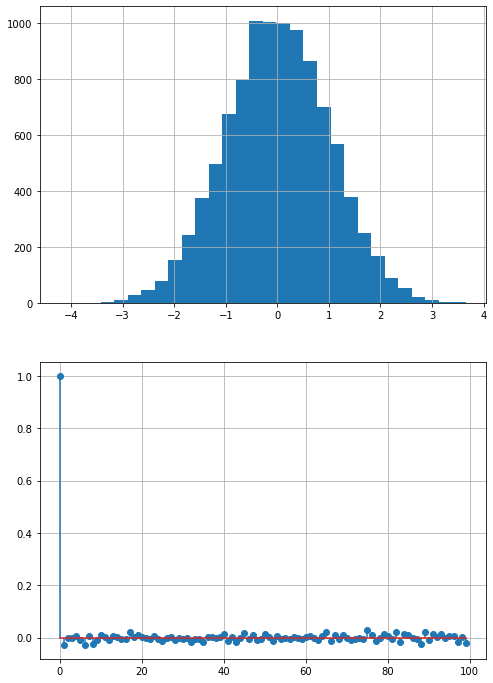

In [9]:
x4d = np.random.normal(0,1,10000)
rx100 = []

for i in range(100):
    rx100.append(auto_corr(x4d,i))
    
fig4d = plt.figure(figsize = (8,12))
ax45 = fig4d.add_subplot(211)
ax45.hist(x4d, bins = 30)
# plt.stem([0],[true_rx],'r', markerfmt = 'ro', label = 'True Auto correlation')
# plt.xlabel('M' , size = 15 , weight = 'bold')
# plt.title(r'Auto correlation sequence of first M = 100 Lags',color='r', size= 15)
ax45.grid()

ax46 = fig4d.add_subplot(212)
ax46.stem(rx100)
ax46.grid()
plt.show()


# 5.)
#### Download the “seeds” dataset from https://archive.ics.uci.edu/ ml/machine-learning-databases/00236/seeds_dataset.txt. It consists of 7 features. More details about the dataset can be found at https://archive.ics.uci.edu/ml/datasets/seeds. Define two custom functions (one for correlation and other for covariance), where each function takes two features as input and returns the correlation or covariance between the features as output. Use these functions to calculate the correlation and covariance between every possible pair of features in the dataset and display the result in the form of table (You are not allowed to use any inbuilt functions). Compare your function results with the inbuilt functions and tabulate them.
#### Correlation coefficient is given by:
$$ r_{xy} = \frac {\sum_{i=1}^{n} (x_{i}-\hat x)(y_{i}-\hat y)}{\sqrt {\sum_{i=1}^{n} (x_{i}-\hat x)^2}\sqrt{{\sum_{i=1}^{n}(y_{i}-\hat y)^2}}} $$
#### Covariance is given by:
$$ Cov_{xy} = \frac {\sum_{i=1}^{n} (x_{i}-\hat x)(y_{i}-\hat y)}{N-1} $$

In [10]:
def  corr_coeff(feat1, feat2): # function to calculate correlation coeff
    num = np.sum((feat1 - feat1.mean()) * (feat2 - feat2.mean()))
    den = np.sqrt(np.sum((feat1 - feat1.mean())**2) * np.sum((feat2 - feat2.mean())**2))
    return num/den

def covariance(feat1, feat2):  # function to calculate covariance
    num = np.sum((feat1 - feat1.mean())*(feat2 - feat2.mean()))
    den = len(feat1)-1
    return num/den
    

In [11]:
df = pd.read_csv('seeds_dataset.txt', sep="\t", header=None)
data = df.to_numpy().T
display(df.head())


,0,1,2,3,4,5,6,7
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220,1
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,1
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825,1
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,1
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,1


In [12]:
# corr and cov using user defined functions
corr_array = np.zeros((7,7))
cov_array = np.zeros((7,7))

for i in range(7):
    for j in range(7):
        corr_array[i][j] = corr_coeff(data[i], data[j])
        cov_array[i][j] = covariance(data[i], data[j])

        
print('Correlation using manually defined function')        
display(pd.DataFrame(corr_array).style.set_caption('Correlation using manually defined function'))

print('\n\nCovariance using manually defined function')        
display(pd.DataFrame(cov_array).style.set_caption('Covariance using manually defined function'))


Correlation using manually defined function


,0,1,2,3,4,5,6
0,1.000000,0.994341,0.608288,0.949985,0.970771,-0.229572,0.863693
1,0.994341,1.000000,0.529244,0.972422,0.944829,-0.217340,0.890784
2,0.608288,0.529244,1.000000,0.367915,0.761635,-0.331471,0.226825
3,0.949985,0.972422,0.367915,1.000000,0.860415,-0.171562,0.932806
4,0.970771,0.944829,0.761635,0.860415,1.000000,-0.258037,0.749131
5,-0.229572,-0.217340,-0.331471,-0.171562,-0.258037,1.000000,-0.011079
6,0.863693,0.890784,0.226825,0.932806,0.749131,-0.011079,1.000000




Covariance using manually defined function


,0,1,2,3,4,5,6
0,8.466351,3.778443,0.041823,1.224704,1.066911,-1.004356,1.235133
1,3.778443,1.705528,0.016332,0.562666,0.466065,-0.426766,0.571753
2,0.041823,0.016332,0.000558,0.003852,0.006798,-0.011777,0.002634
3,1.224704,0.562666,0.003852,0.196305,0.143992,-0.114290,0.203125
4,1.066911,0.466065,0.006798,0.143992,0.142668,-0.146543,0.139068
5,-1.004356,-0.426766,-0.011777,-0.114290,-0.146543,2.260684,-0.008187
6,1.235133,0.571753,0.002634,0.203125,0.139068,-0.008187,0.241553


In [13]:
# corr and cov using inbuilt function

corr_numpy = np.corrcoef(data[0:7])
cov_numpy = np.cov(data[0:7])


print('Correlation using inbuilt function')        
display(pd.DataFrame(corr_numpy).style.set_caption('Correlation using inbuilt function'))

print('\n\nCovariance using inbuilt function')        
display(pd.DataFrame(cov_numpy).style.set_caption('Covariance using inbuilt function'))


Correlation using inbuilt function


,0,1,2,3,4,5,6
0,1.000000,0.994341,0.608288,0.949985,0.970771,-0.229572,0.863693
1,0.994341,1.000000,0.529244,0.972422,0.944829,-0.217340,0.890784
2,0.608288,0.529244,1.000000,0.367915,0.761635,-0.331471,0.226825
3,0.949985,0.972422,0.367915,1.000000,0.860415,-0.171562,0.932806
4,0.970771,0.944829,0.761635,0.860415,1.000000,-0.258037,0.749131
5,-0.229572,-0.217340,-0.331471,-0.171562,-0.258037,1.000000,-0.011079
6,0.863693,0.890784,0.226825,0.932806,0.749131,-0.011079,1.000000




Covariance using inbuilt function


,0,1,2,3,4,5,6
0,8.466351,3.778443,0.041823,1.224704,1.066911,-1.004356,1.235133
1,3.778443,1.705528,0.016332,0.562666,0.466065,-0.426766,0.571753
2,0.041823,0.016332,0.000558,0.003852,0.006798,-0.011777,0.002634
3,1.224704,0.562666,0.003852,0.196305,0.143992,-0.114290,0.203125
4,1.066911,0.466065,0.006798,0.143992,0.142668,-0.146543,0.139068
5,-1.004356,-0.426766,-0.011777,-0.114290,-0.146543,2.260684,-0.008187
6,1.235133,0.571753,0.002634,0.203125,0.139068,-0.008187,0.241553


#### Correlation and covariance are same with both inbuilt and manually defined functions.

# 6 a.)
#### Consider a random process X(t) =$ 5 sin (2t + ϕ_1) + 6 cos (3t + ϕ_2)$, where $ϕ_1 and ϕ_2$ are uniformly distributed in [−π, π] and [0, 2π], respectively, and $ϕ_1 and ϕ_2$ are independent of each other.
#### (a) Determine if X(t) is a Wide Sense Stationary (WSS) Process . If yes, plot X(t) and its auto-correlation sequence.
#### (b) If M(t) is a WSS process and M(t) is independent of ϕ1 and ϕ2, check whether the product M(t)X(t) is a WSS or not. Provide your explanation on a paper and share the screenshot of the same.

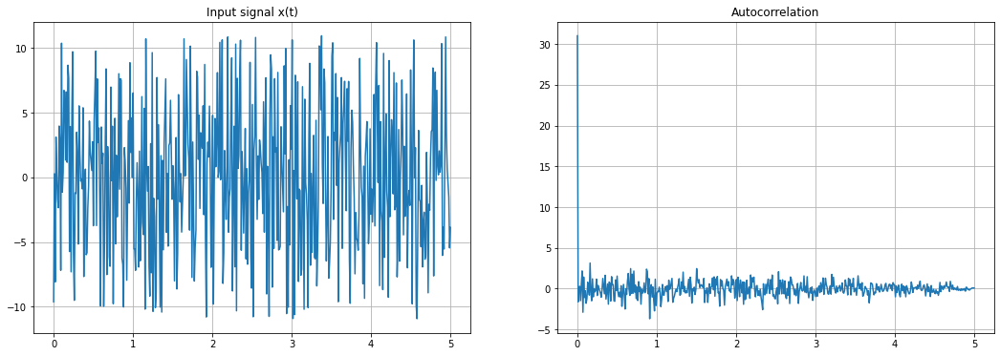

In [14]:
def x_t(t,phi1,phi2):
    return 5*np.sin(2*t+phi1) + 6*np.sin(3*t+phi2)

def autocorr(x):
    N = len(x)
    r = np.zeros(N)
    for k in range(N):
        for i in range(N):
            if(i-k<0):
                r[k] += 0
            else:
                r[k] += (x[i]*x[i-k])/N
    return r

phi1 = np.linspace(-np.pi,np.pi)
phi2 = np.linspace(0,2*np.pi)

t = np.linspace(0,5,500)
x = [x_t(i,random.choice(phi1),random.choice(phi2)) for i in t]

r = autocorr(x)

fig66 = plt.figure(figsize=(18, 6))
ax61b = fig66.add_subplot(121)
ax61b.plot(t,x)
ax61b.set_title("Input signal x(t)")
ax61b.grid()

ax6b2 = fig66.add_subplot(122)
ax6b2.plot(t,r)
ax6b2.set_title("Autocorrelation")
ax6b2.grid()

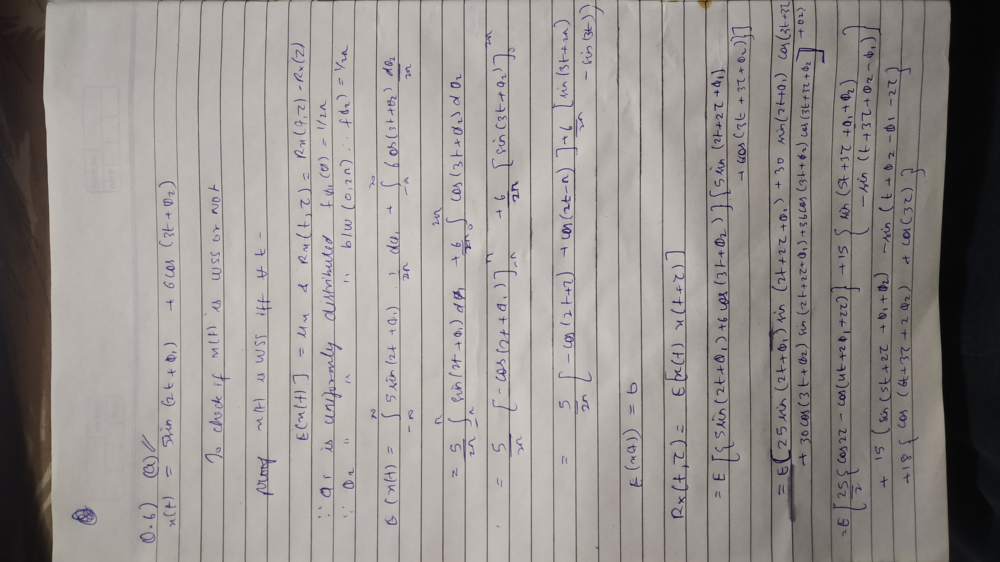

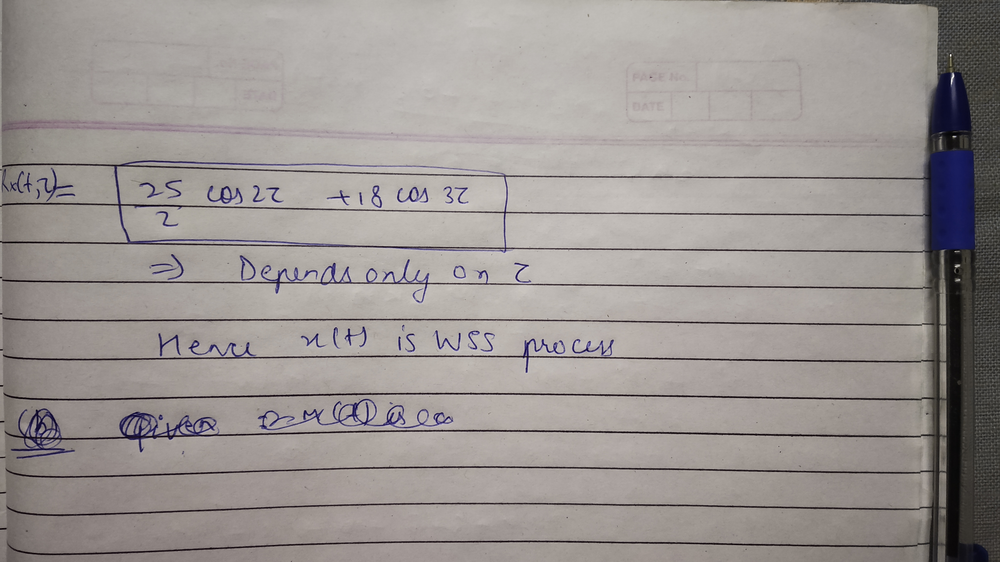

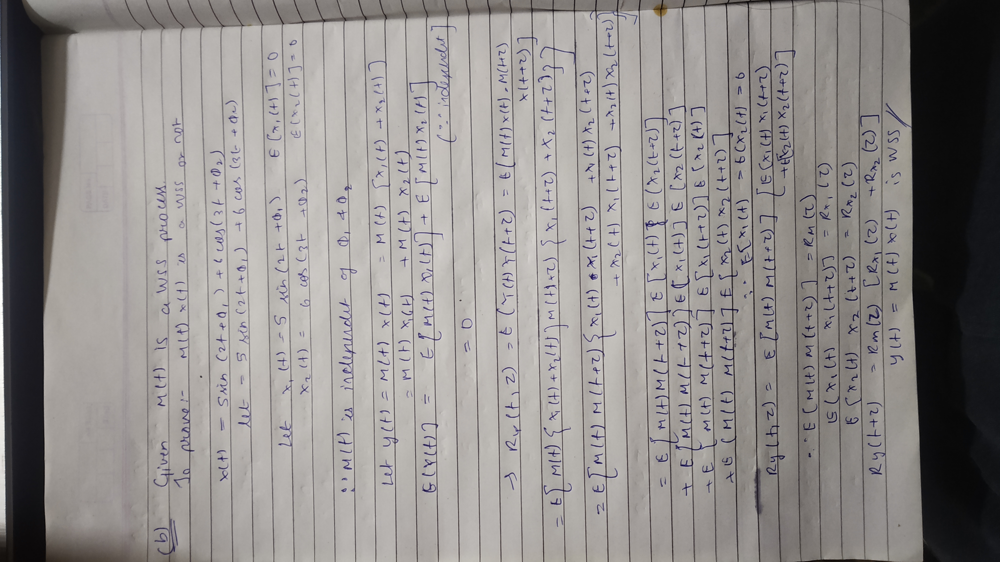

# 7 a.)
#### Draw out a sample for chi-squared distribution with degree of freedom 2 with size 2 × 3.

In [15]:
chi_sq_samp = np.random.chisquare(df=2,size=(2,3)) # getting random values of chi square distribution

print('Samples drawm from chi squared distribution are:\n')
display(pd.DataFrame(chi_sq_samp))




Samples drawm from chi squared distribution are:



,0,1,2
0,1.324546,0.003686,0.107432
1,5.527947,1.637297,3.365053


# 7 b.)
#### Visualize chi-square distribution with degree of freedom = [1, 4, 8, 12] for a size of 1000.

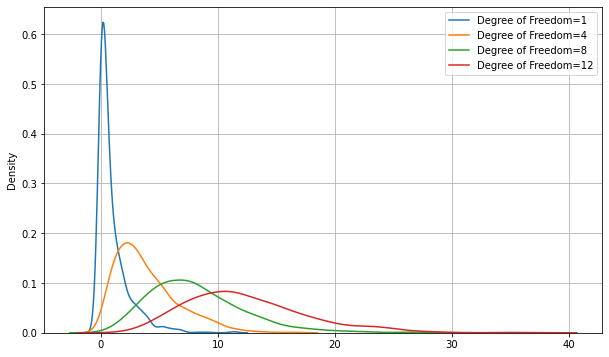

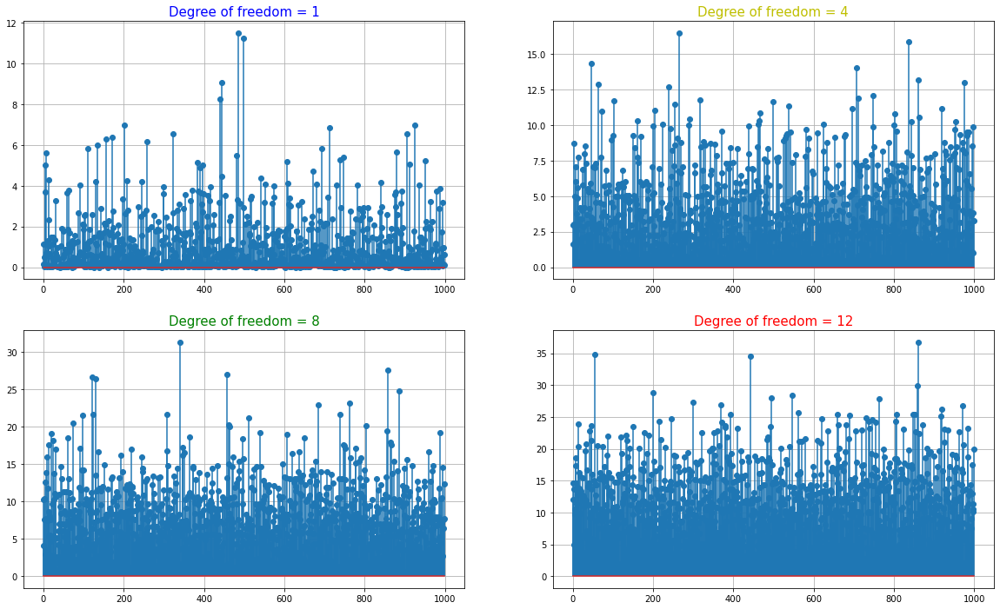

In [16]:
# getting random values of chi square distribution for different DoF
chisq_1 = np.random.chisquare(df=1,size=1000)
chisq_4 = np.random.chisquare(df=4,size=1000)
chisq_8 = np.random.chisquare(df=8,size=1000)
chisq_12 = np.random.chisquare(df=12,size=1000)

# Plotting the curves
fig7b = plt.figure(figsize=(10,6))
sns.kdeplot(chisq_1,label='Degree of Freedom=1')
sns.kdeplot(chisq_4,label='Degree of Freedom=4')
sns.kdeplot(chisq_8,label='Degree of Freedom=8')
sns.kdeplot(chisq_12,label='Degree of Freedom=12')
plt.grid()
plt.legend()
plt.show()

fig7b2 = plt.figure(figsize=(20,12))
ax71 = fig7b2.add_subplot(221)
ax71.stem(chisq_1)
ax71.set_title('Degree of freedom = 1', color = 'b', size = 15)
plt.grid()

ax72 = fig7b2.add_subplot(222)
ax72.stem(chisq_4)
ax72.set_title('Degree of freedom = 4', color = 'y', size = 15)
plt.grid()

ax72 = fig7b2.add_subplot(223)
ax72.stem(chisq_8)
ax72.set_title('Degree of freedom = 8', color = 'g', size = 15)
plt.grid()

ax72 = fig7b2.add_subplot(224)
ax72.stem(chisq_12)
ax72.set_title('Degree of freedom = 12', color = 'r', size = 15)
plt.grid()

# 8 a.)
#### Draw out a sample for exponential distribution with 2.0 scale with 2x3 size

In [17]:
exp_dist = np.random.exponential(scale=2,size=(2,3)) # getting random values of exponential distribution

print('samples drawm from Exponential distribution are:\n')
display(pd.DataFrame(exp_dist))



samples drawm from Exponential distribution are:



,0,1,2
0,3.872969,1.571100,0.954298
1,0.290842,4.471144,1.303077


# 8 b.)
#### Visualize exponential distribution for a size of 1000.

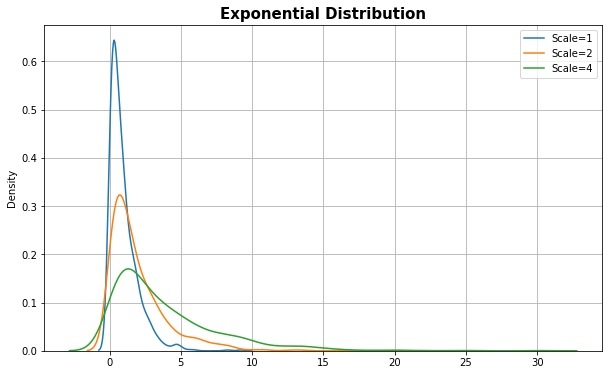

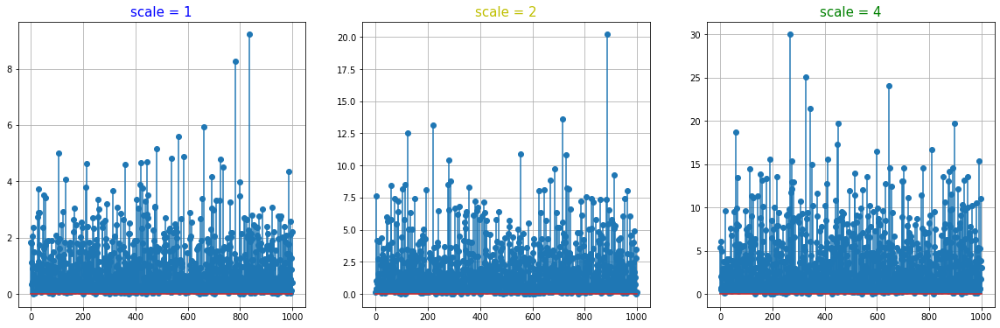

In [18]:
# getting random values of exponential distribution for different scale values
exp_dist1 = np.random.exponential(scale = 1, size=1000)
exp_dist2 = np.random.exponential(scale = 2, size=1000)
exp_dist3 = np.random.exponential(scale = 4, size=1000)

# Plotting the curves
plt.figure(figsize=(10,6))
sns.kdeplot(exp_dist1,label='Scale=1')
sns.kdeplot(exp_dist2,label='Scale=2')
sns.kdeplot(exp_dist3,label='Scale=4')
plt.title('Exponential Distribution', size = 15, weight = 'bold')
plt.grid()
plt.legend()
plt.show()

fig8b = plt.figure(figsize=(20,6))
ax81 = fig8b.add_subplot(131)
ax81.stem(exp_dist1)
ax81.set_title('scale = 1', color = 'b', size = 15)
plt.grid()

ax82 = fig8b.add_subplot(132)
ax82.stem(exp_dist2)
ax82.set_title('scale = 2', color = 'y', size = 15)
plt.grid()

ax82 = fig8b.add_subplot(133)
ax82.stem(exp_dist3)
ax82.set_title('scale = 4', color = 'g', size = 15)
plt.grid()



# 9 a.)
#### Generate a 1-D array containing 100 values, where each value has to be 2, 4, 6 or 8. The probability for the value to be 2, 4, 6, and 8 is set to be 0.1, 0.3, 0.6, 0, respectively.

In [19]:
# generating 1*100 size array
array1 = np.random.choice([2,4,6,8],100 ,p=[0.1,0.3,0.6,0]) 
print("Size 100 array\n", array1)


Size 100 array
 [4 4 6 6 2 4 6 6 6 6 6 4 2 6 6 4 6 6 6 4 2 6 6 6 6 6 6 6 6 6 2 4 4 6 6 4 4
 6 2 4 6 6 6 6 6 6 4 2 6 6 6 4 4 6 2 4 6 6 4 4 4 6 6 6 4 6 6 4 6 4 6 6 4 2
 6 6 6 4 6 4 4 6 4 6 6 6 4 4 4 6 6 6 6 6 6 6 4 4 6 4]


# 9 b.)
#### For the same example as (a), return a 2-D array with 3 rows, each containing 5 values.

In [20]:
# generating 3*5 size array
array2 = (np.random.choice([2,4,6,8],(3,5),p=[0.1,0.3,0.6,0]))
print('\n\nSize 3*5 array\n',array2)



Size 3*5 array
 [[4 6 4 4 6]
 [2 6 6 4 6]
 [6 6 6 6 2]]


# 10 a.)
#### Generate central chi-squared distributed random variables with degrees of freedom k = 1, 2, 3, 4, 5 and plot the PDFs. Write your own function, where the function takes input as degrees of freedom and returns output has chi-sqaured distributed random variable.

#### The pdf of a central chi squared distribution is given by
$$ f(x) = \frac{1}{2^{n/2} \Gamma(n/2)} x^{n/2-1} e^{-x/2}$$

<ipython-input-21-82e7a795ea41>:2: RuntimeWarning: divide by zero encountered in power
  pdf = x**((k/2)-1)*np.exp(-x/2)/((2**(k/2))*(math.gamma(k/2)))


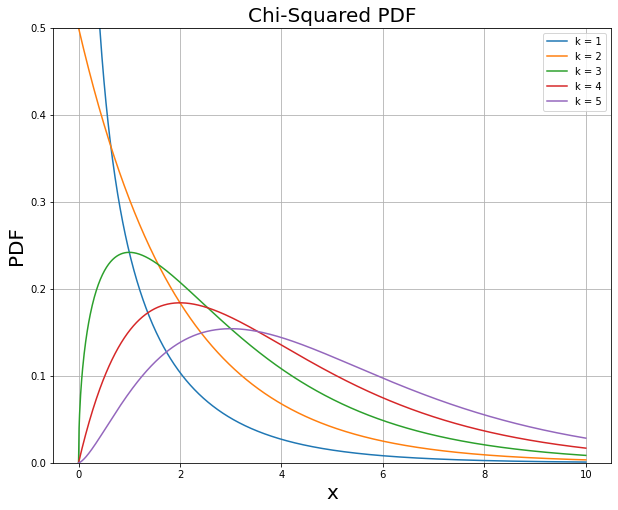

In [21]:
def chi_Sq(x,k): # function to get pdf of central chisquared distribution
    pdf = x**((k/2)-1)*np.exp(-x/2)/((2**(k/2))*(math.gamma(k/2)))
    return pdf

x = np.linspace(0,10,1000) # time axis

K = [1,2,3,4,5] # values of k

fig10a = plt.figure(figsize = (10,8))

for k in K:
    pdf = chi_Sq(x,k) # getting pdf for different values of k
    plt.plot(x,pdf, label = f"k = {k}") # plottng the curve
    plt.ylim(0,0.5)

    
plt.xlabel("x", size = 20)
plt.ylabel("PDF", size = 20)
plt.title("Chi-Squared PDF",size = 20)
plt.grid()
plt.legend()
plt.show()

# 10 b.)
#### Given the degrees of freedom k and non-centrality parameter λ, write a function to generate a sequence of random numbers that are non-central chi-squared distributed. Plot the PDFs for non-central chisquared random variables for two different degrees of freedom k = 2 and k = 4, each with three different non-centrality parameters λ = 1, 2, 3.

#### The pdf of a non-central chi squared distribution is given by
$$ g(x) = \sum_{k=0}^{\infty} e^{-\lambda/2} \frac{(\lambda/2)^{k}}{k!} f_{n+2k}(x)$$  
#### where $ f_{k}(x) $ represent pdf of chi squared distribution with k degrees of freedom

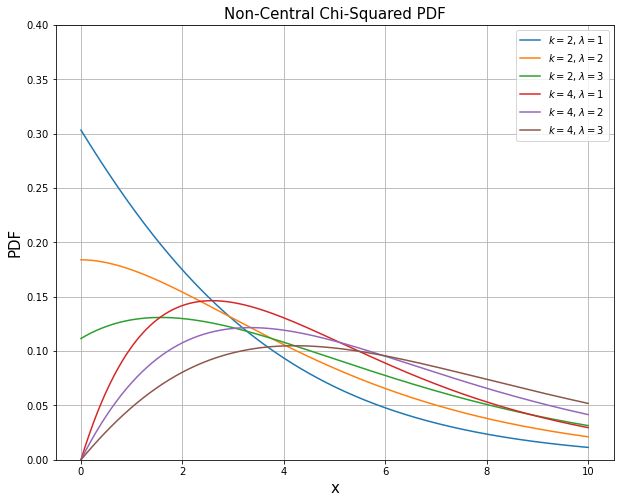

In [22]:
from scipy.special import iv

def chi_Sq_non_central(x,l,k): # function to get pdf of non central chisquared distribution
    pdf = 0.5 * np.exp(-0.5 * (x + l)) * np.power(x/l , (k/4 - 0.5)) * iv( 0.5*k-1 , np.sqrt(l*x) )
    return pdf
 
    
K = [2,4]  
lam = [1,2,3]

fig10b = plt.figure(figsize = (10,8))

# getting pdf of non central chisq distribution for different k and lambda
for k in K:
    for l in lam:
        pdf = chi_Sq_non_central(x,l,k)
        plt.plot(x,pdf,label=fr"$k={k}$, $\lambda={l}$") # plotting the curve
        plt.ylim(0,1)

plt.xlabel("x",size = 15)
plt.ylabel("PDF", size = 15 )
plt.ylim(0,0.4)
plt.title("Non-Central Chi-Squared PDF",size = 15)
plt.grid()
plt.legend()
plt.show()